<a href="https://colab.research.google.com/github/Handsome-Mustache/FastbookTutorials/blob/main/L2_Production_Pasquale.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#hide
! [ -e /content ] && pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 33.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 16.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 15.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 52.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.
Mounted at /content/gdrive


In [ ]:
#hide
from fastbook import *
from fastai.vision.widgets import *

In [ ]:
search_images_ddg

<function fastbook.search_images_ddg(term, max_images=200)>

I want my model to distinguish between 3 types of cat. Long hair tabby, short hair tabby, hairless cat breeds.

In [ ]:
#define search terms
cat_types = 'long hair tabby', 'short hair tabby', 'hairless'

#path where folders will be made for each cat category
path = Path('cat_types')
#make this folder
if not path.exists():
  #make a folder for each of the categories
    path.mkdir()
    for o in cat_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        #searching for urls and downloading images from the list of image URLs
        results = search_images_ddg(f'{o} cat')
        download_images(dest, urls=results)

In [ ]:
fns = get_image_files(path)

#check which images cannot be opened
failed = verify_images(fns)
#remove image files
failed.map(Path.unlink)
len(failed) #return how many failed images we had

8

In [ ]:
cats = DataBlock(blocks = (ImageBlock, CategoryBlock),
                 get_items=get_image_files,
                 splitter = RandomSplitter(valid_pct=0.2, seed = 69),
                 get_y=parent_label,
                 item_tfms=Resize(128)
                 )

In [ ]:
dls = cats.dataloaders(path)

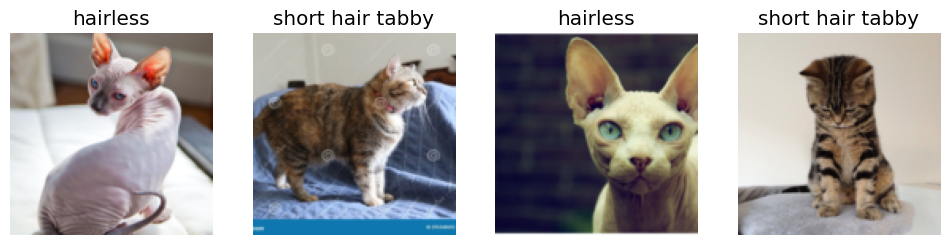

In [ ]:
#show me some of my validation set!
dls.valid.show_batch(max_n=4, nrows=1)

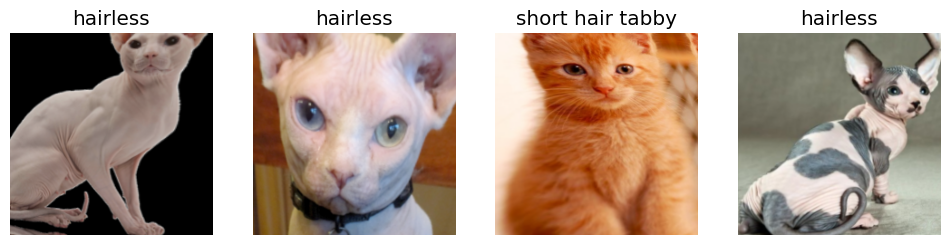

In [ ]:
cats = cats.new(item_tfms=RandomResizedCrop(224, min_scale=0.5),
                batch_tfms=aug_transforms())
dls = cats.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1)

In [ ]:
#create the machine learner
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.368321,0.401208,0.155963,00:19


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


epoch,train_loss,valid_loss,error_rate,time
0,0.511648,0.255022,0.110092,00:19
1,0.425649,0.187587,0.064220,00:19
2,0.365478,0.221197,0.082569,00:19
3,0.332324,0.228384,0.091743,00:19


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


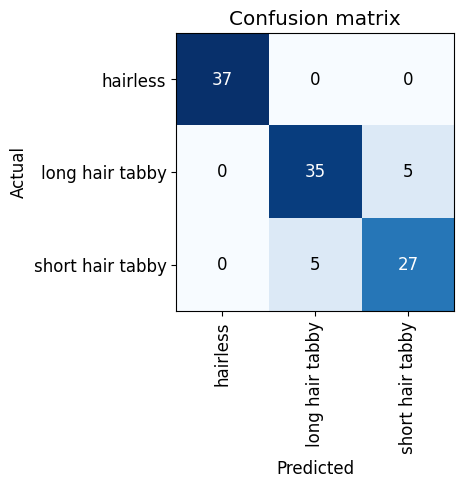

In [ ]:
#time to clean
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

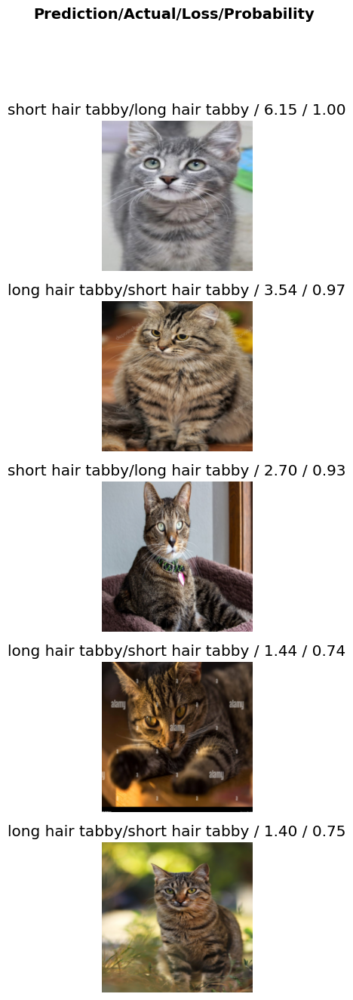

In [ ]:
interp.plot_top_losses(5, nrows=5)

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [ ]:
# Recreate the DataLoaders with the updated dataset
dls = cats.dataloaders(path)

# Now, retrain the model with the new DataLoaders
learn.dls = dls  # Assign the new dataloaders to the learner
learn.fine_tune(4)  # Retrain for 4 epochs

epoch,train_loss,valid_loss,error_rate,time
0,0.207528,0.353208,0.110092,00:19


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


epoch,train_loss,valid_loss,error_rate,time
0,0.247158,0.345382,0.091743,00:22
1,0.263346,0.409961,0.082569,00:19
2,0.246568,0.454177,0.073394,00:18
3,0.216046,0.450168,0.073394,00:18


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [ ]:
learn.export()

In [ ]:
patH=Path()
patH.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [ ]:
path = Path()
learn_inf=load_learner(path/'CatClassifier.pkl')

In [ ]:
image = search_images_ddg('tabby cat', max_images=1)
download_url(image[0], path/"cat.JPG")


Path('cat.JPG')

<Axes: >

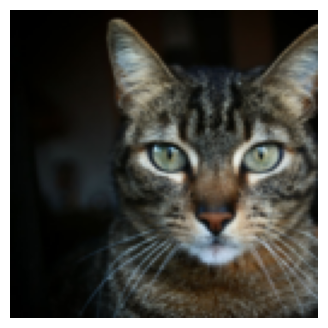

In [ ]:
im = PILImage.create(path/'cat.JPG')
resize_tfm = Resize(128)
ims = resize_tfm(im)
ims.save(path/'cat.JPG')
ims.show()

In [ ]:
categoryName, categoryNum, tensorOfprob = learn_inf.predict(path/'cat.JPG')

In [ ]:
print(f"This is a {categoryName} cat. Probability: {round(tensorOfprob[categoryNum].item(),3)}")

This is a short hair tabby cat. Probability: 0.994
